# Loading Libraries & Data

In [1]:
import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)

import numpy as np
import pandas as pd
import os
import random

import matplotlib.pyplot as plt
import plotly.express as px
import seaborn as sns
import missingno as msno

import cv2
import albumentations as A
from glob import glob
from PIL import Image

import torch
from torch.utils.data import DataLoader, Dataset
import torchvision.transforms as transforms
import torchvision

In [2]:
train_df = pd.read_csv("../input/siim-isic-melanoma-classification/train.csv")
test_df = pd.read_csv("../input/siim-isic-melanoma-classification/test.csv")

print("Length of Train Data: {}".format(len(train_df)))
print("Length of Test Data: {}".format(len(test_df)))

Length of Train Data: 33126
Length of Test Data: 10982


# Data Preparation

In [3]:
train_path = "../input/siim-isic-melanoma-classification/jpeg/train"
train_df['image_name'] += '.jpg'

test_path = "../input/siim-isic-melanoma-classification/jpeg/test"
test_df['image_name'] += '.jpg'

train_df['path'] = train_path + '/' + train_df['image_name']
test_df['path'] = test_path + '/' + test_df['image_name']

In [4]:
train_df.head()

,image_name,patient_id,sex,age_approx,anatom_site_general_challenge,diagnosis,benign_malignant,target,path
0,ISIC_2637011.jpg,IP_7279968,male,45.0,head/neck,unknown,benign,0,../input/siim-isic-melanoma-classification/jpe...
1,ISIC_0015719.jpg,IP_3075186,female,45.0,upper extremity,unknown,benign,0,../input/siim-isic-melanoma-classification/jpe...
2,ISIC_0052212.jpg,IP_2842074,female,50.0,lower extremity,nevus,benign,0,../input/siim-isic-melanoma-classification/jpe...
3,ISIC_0068279.jpg,IP_6890425,female,45.0,head/neck,unknown,benign,0,../input/siim-isic-melanoma-classification/jpe...
4,ISIC_0074268.jpg,IP_8723313,female,55.0,upper extremity,unknown,benign,0,../input/siim-isic-melanoma-classification/jpe...


In [5]:
test_df.head()

,image_name,patient_id,sex,age_approx,anatom_site_general_challenge,path
0,ISIC_0052060.jpg,IP_3579794,male,70.0,NaN,../input/siim-isic-melanoma-classification/jpe...
1,ISIC_0052349.jpg,IP_7782715,male,40.0,lower extremity,../input/siim-isic-melanoma-classification/jpe...
2,ISIC_0058510.jpg,IP_7960270,female,55.0,torso,../input/siim-isic-melanoma-classification/jpe...
3,ISIC_0073313.jpg,IP_6375035,female,50.0,torso,../input/siim-isic-melanoma-classification/jpe...
4,ISIC_0073502.jpg,IP_0589375,female,45.0,lower extremity,../input/siim-isic-melanoma-classification/jpe...


In [6]:
train_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 33126 entries, 0 to 33125
Data columns (total 9 columns):
 #   Column                         Non-Null Count  Dtype  
---  ------                         --------------  -----  
 0   image_name                     33126 non-null  object 
 1   patient_id                     33126 non-null  object 
 2   sex                            33061 non-null  object 
 3   age_approx                     33058 non-null  float64
 4   anatom_site_general_challenge  32599 non-null  object 
 5   diagnosis                      33126 non-null  object 
 6   benign_malignant               33126 non-null  object 
 7   target                         33126 non-null  int64  
 8   path                           33126 non-null  object 
dtypes: float64(1), int64(1), object(7)
memory usage: 2.3+ MB


In [7]:
new_names = ['dcm_name', 'ID', 'sex', 'age', 'anatomy', 'diagnosis', 'benign_malignant', 'target', 'path']
train_df.columns = new_names
test_df.columns = new_names[:6]

In [8]:
benign_data = train_df[train_df['benign_malignant'] == 'benign']
malignant_data = train_df[train_df['benign_malignant'] == 'malignant']

benign_data.reset_index(drop = True, inplace = True)
malignant_data.reset_index(drop = True, inplace = True)

# EDA on CSV

### 1. Checking out Missing Values 

In [9]:
print(train_df.isnull().sum())
print()
print(test_df.isnull().sum())

dcm_name              0
ID                    0
sex                  65
age                  68
anatomy             527
diagnosis             0
benign_malignant      0
target                0
path                  0
dtype: int64

dcm_name       0
ID             0
sex            0
age            0
anatomy      351
diagnosis      0
dtype: int64


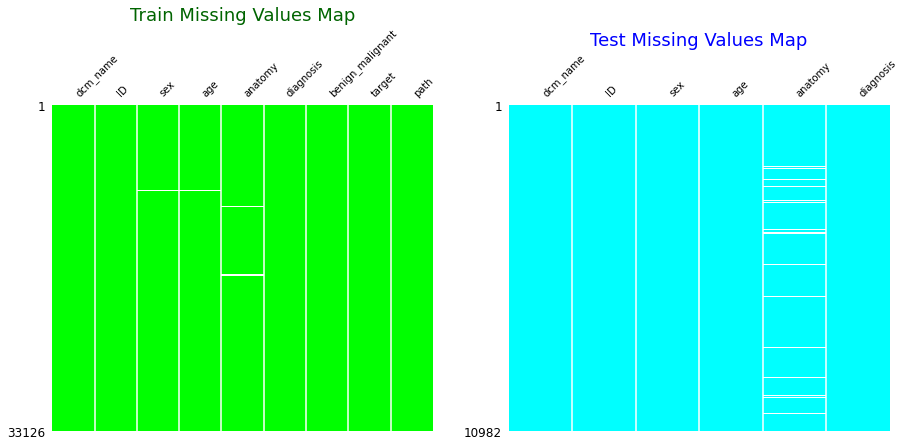

In [10]:
f, (ax1, ax2) = plt.subplots(1, 2, figsize = (15, 6))

msno.matrix(train_df, ax = ax1, sparkline = False, color = (0,255,0), fontsize=10);
msno.matrix(test_df, ax = ax2, sparkline = False, color = (0,191,255), fontsize=10);

ax1.set_title('Train Missing Values Map', fontsize = 18, color = "#006400");
ax2.set_title('Test Missing Values Map', fontsize = 18, color = "#0000FF");

### 2. Gender Plot

In [11]:
print(train_df['sex'].value_counts())
print()
print(test_df['sex'].value_counts())

male      17080
female    15981
Name: sex, dtype: int64

male      6255
female    4727
Name: sex, dtype: int64


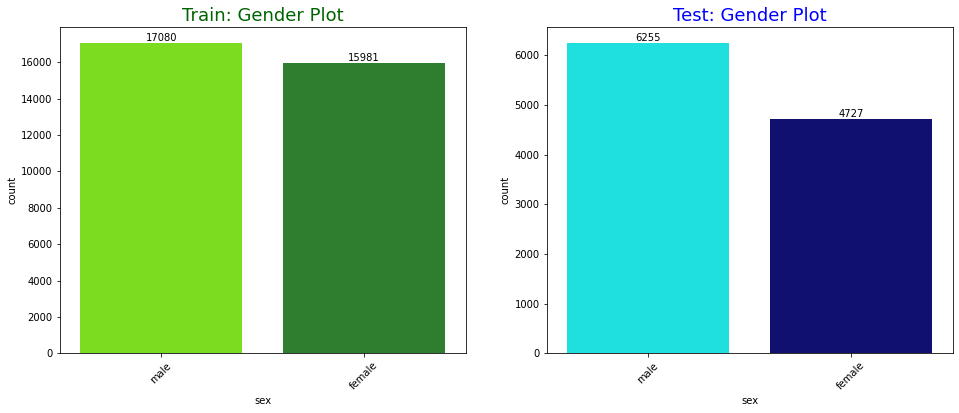

In [12]:
f, (ax1, ax2) = plt.subplots(1, 2, figsize = (16, 6))

a = sns.countplot(data = train_df, x = 'sex', palette = ["#7CFC00", "#228B22"], ax = ax1);
a = sns.countplot(data = test_df, x = 'sex', palette = ["#00FFFF", "#000080"], ax = ax2);

ax1.set_title('Train: Gender Plot', fontsize = 18, color = "#006400");
ax2.set_title('Test: Gender Plot', fontsize = 18, color = "#0000FF");

ax1.bar_label(ax1.containers[0]);
ax2.bar_label(ax2.containers[0]);

ax1.tick_params(axis = 'x', rotation = 45)
ax2.tick_params(axis = 'x', rotation = 45)

### 3. Age Plot

In [13]:
print(train_df['age'].describe())
print()
print(test_df['age'].describe())

count    33058.000000
mean        48.870016
std         14.380360
min          0.000000
25%         40.000000
50%         50.000000
75%         60.000000
max         90.000000
Name: age, dtype: float64

count    10982.000000
mean        49.525587
std         14.370589
min         10.000000
25%         40.000000
50%         50.000000
75%         60.000000
max         90.000000
Name: age, dtype: float64


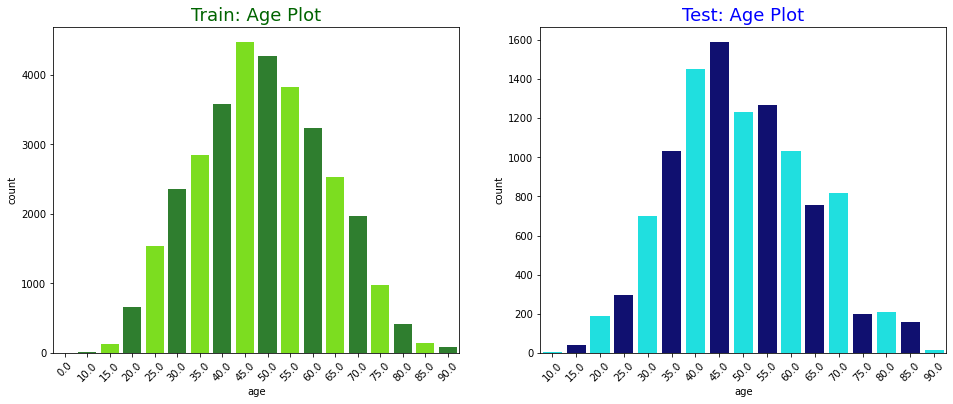

In [14]:
f, (ax1, ax2) = plt.subplots(1, 2, figsize = (16, 6))

a = sns.countplot(data = train_df, x = 'age', palette = ["#7CFC00", "#228B22"], ax = ax1);
a = sns.countplot(data = test_df, x = 'age', palette = ["#00FFFF", "#000080"], ax = ax2);

ax1.set_title('Train: Age Plot', fontsize = 18, color = "#006400");
ax2.set_title('Test: Age Plot', fontsize = 18, color = "#0000FF");

ax1.tick_params(axis = 'x', rotation = 45)
ax2.tick_params(axis = 'x', rotation = 45)

### 4. Anatomy Plot

In [15]:
print(train_df['anatomy'].value_counts())
print()
print(test_df['anatomy'].value_counts())

torso              16845
lower extremity     8417
upper extremity     4983
head/neck           1855
palms/soles          375
oral/genital         124
Name: anatomy, dtype: int64

torso              5847
lower extremity    2501
upper extremity    1573
head/neck           576
palms/soles         108
oral/genital         26
Name: anatomy, dtype: int64


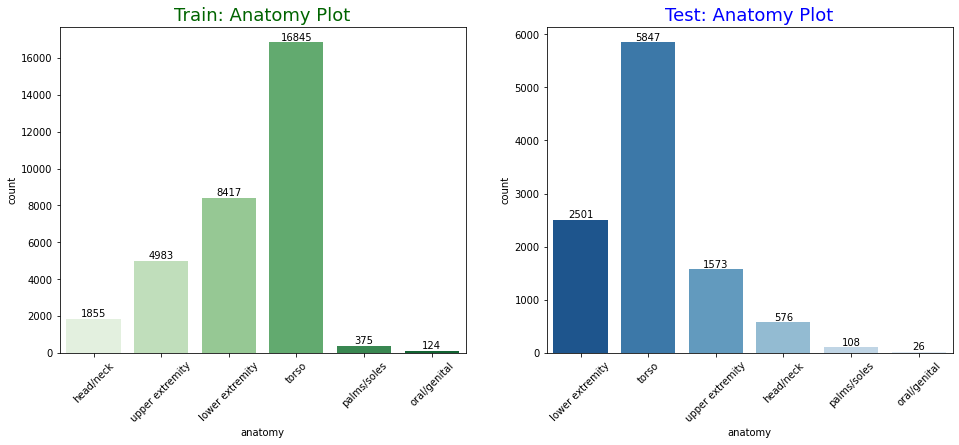

In [16]:
f, (ax1, ax2) = plt.subplots(1, 2, figsize = (16, 6))

a = sns.countplot(data = train_df, x = 'anatomy', palette = "Greens", ax = ax1);
a = sns.countplot(data = test_df, x = 'anatomy', palette = "Blues_r", ax = ax2);

ax1.set_title('Train: Anatomy Plot', fontsize = 18, color = "#006400");
ax2.set_title('Test: Anatomy Plot', fontsize = 18, color = "#0000FF");

ax1.bar_label(ax1.containers[0]);
ax2.bar_label(ax2.containers[0]);

ax1.tick_params(axis = 'x', rotation = 45)
ax2.tick_params(axis = 'x', rotation = 45)

### 5. Target Feature Plot

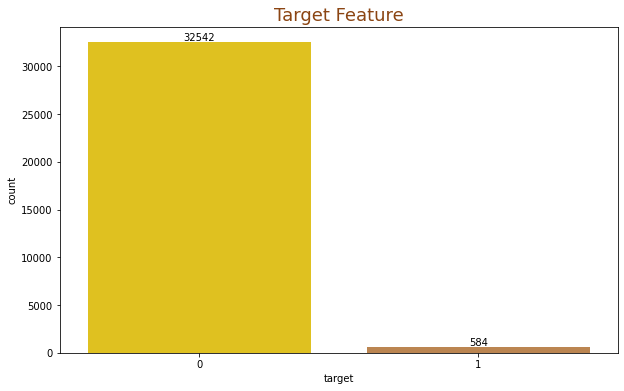

In [17]:
plt.figure(figsize = (10, 6))

a = sns.countplot(data = train_df, x = 'target', palette = ['#FFD700', '#CD853F']);
a.bar_label(a.containers[0]);
a.set_title('Target Feature', fontsize = 18, color = "#8B4513");

### 6. Features affecting the target (parallel category diagram)

In [18]:
train_parallel = train_df[['dcm_name', 'ID', 'sex', 'age', 'anatomy', 'diagnosis', 'target']]

fig = px.parallel_categories(train_parallel, color="target", color_continuous_scale = px.colors.sequential.algae)
fig.update_layout(title = 'Parallel Category Diagram')
fig.show()

# EDA on Images

### 1. Random Image Properties & its Blue Channel

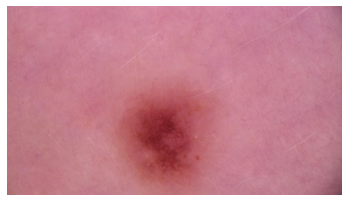

In [19]:
plt.figure()
image = cv2.imread("../input/siim-isic-melanoma-classification/jpeg/train/ISIC_0076995.jpg")[...,::-1]
plt.imshow(image)
plt.axis('off')
plt.show() 

In [20]:
print('Image Shape: {}'.format(image.shape))
print('Image Height: {}'.format(image.shape[0]))
print('Image Width: {}'.format(image.shape[1]))
print('Image Dimension: {}'.format(image.ndim))
print('Image Size: {}kb'.format(image.size//1024))
print('Image Data Type: {}'.format(image.dtype))
print('Maximum RGB value of the image: {}'.format(image.max()))
print('Minimum RGB value of the image: {}'.format(image.min()))

Image Shape: (1053, 1872, 3)
Image Height: 1053
Image Width: 1872
Image Dimension: 3
Image Size: 5775kb
Image Data Type: uint8
Maximum RGB value of the image: 245
Minimum RGB value of the image: 21


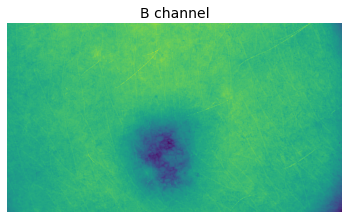

In [21]:
plt.title('B channel', fontsize = 14)
plt.imshow(image[ : , : , 0])
plt.axis('off');
plt.show()

### 2. Random Images Plot

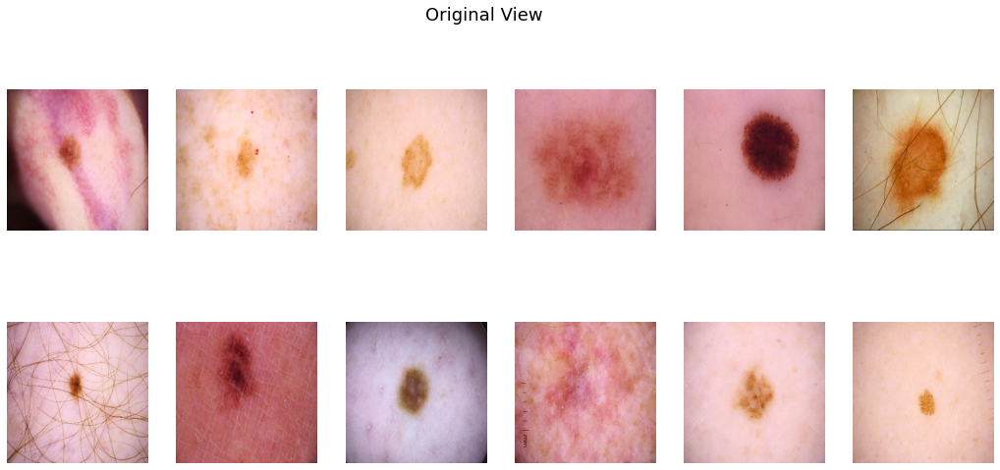

In [22]:
image_list = train_df.sample(12)['path']
image_list = image_list.reset_index()['path']

plt.figure(figsize = (18, 8))
plt.suptitle("Original View", fontsize = 18)
    
for k, path in enumerate(image_list):
    image = cv2.imread(path)[...,::-1]
    image = cv2.resize(image,(300, 300))
    plt.subplot(2, 6, k+1)
    plt.imshow(image)
    plt.axis('off')

### 3. Benign Vs Malignant Images Plot

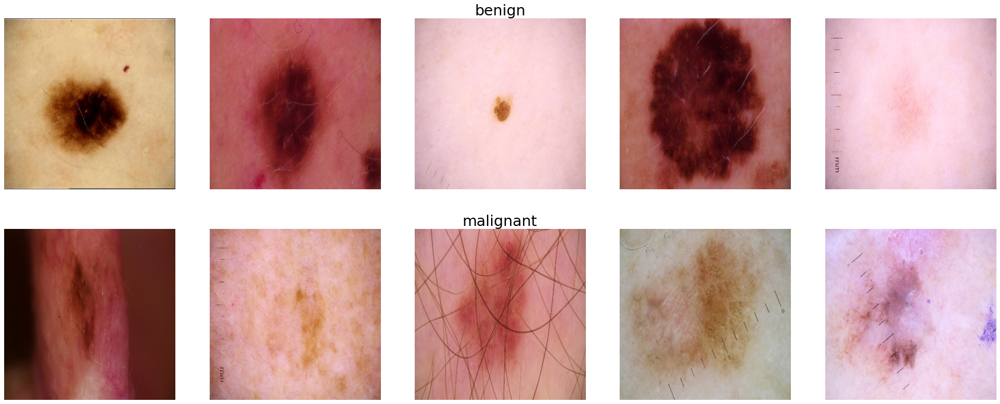

In [23]:
n_samples = 5
fig, m_axs = plt.subplots(2, n_samples, figsize = (6*n_samples, 3*4))

for n_axs, (type_name, type_rows) in zip(m_axs, train_df.sort_values(['benign_malignant']).groupby('benign_malignant')):
    n_axs[2].set_title(type_name, fontsize = 25)
    for c_ax, (_, c_row) in zip(n_axs, type_rows.sample(n_samples, random_state = 1234).iterrows()):       
        picture = c_row['path']
#       print(c_row['path'],c_row['benign_malignant'])
        image = cv2.imread(picture)[...,::-1]
        image = cv2.resize(image, (400, 400))
        c_ax.imshow(image)
        c_ax.axis('off')

### 4. Channel Intensity

Image dimensions:  (4000, 6000)
Maximum pixel value : 255.0 ; Minimum pixel value:0.0
Mean value of the pixels : 171.1 ; Standard deviation : 42.0


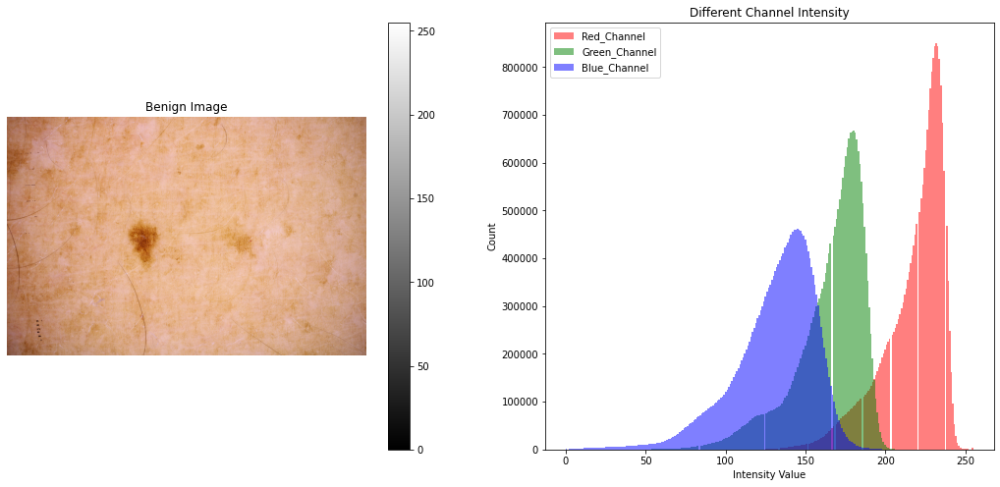

In [24]:
f = plt.figure(figsize = (18, 8))

f.add_subplot(1,2,1)

sample_img = "ISIC_0015719.jpg"
raw_image = plt.imread(os.path.join(train_path, sample_img))
plt.imshow(raw_image, cmap='gray')
plt.axis('off')
plt.colorbar()
plt.title('Benign Image')
print(f"Image dimensions:  {raw_image.shape[0],raw_image.shape[1]}")
print(f"Maximum pixel value : {raw_image.max():.1f} ; Minimum pixel value:{raw_image.min():.1f}")
print(f"Mean value of the pixels : {raw_image.mean():.1f} ; Standard deviation : {raw_image.std():.1f}")

f.add_subplot(1,2,2)

plt.hist(raw_image[:, :, 0].ravel(), bins = 256, color = 'red', alpha = 0.5)
plt.hist(raw_image[:, :, 1].ravel(), bins = 256, color = 'Green', alpha = 0.5)
plt.hist(raw_image[:, :, 2].ravel(), bins = 256, color = 'Blue', alpha = 0.5)
plt.xlabel('Intensity Value')
plt.ylabel('Count')
plt.legend(['Red_Channel', 'Green_Channel', 'Blue_Channel'])
plt.title('Different Channel Intensity')
plt.show()

### 5. Bening Vs Malignant Albumentations Augmentations

In [25]:
def plot_multiple_img(img_matrix_list, title_list, ncols, main_title):
    
    fig, myaxes = plt.subplots(figsize = (18, 12), nrows = 3, ncols = ncols, squeeze = False)
    fig.suptitle(main_title, fontsize = 18)
    fig.subplots_adjust(wspace = 0.3)
    fig.subplots_adjust(hspace = 0.3)
    
    for i, (img, title) in enumerate(zip(img_matrix_list, title_list)):
        myaxes[i // ncols][i % ncols].imshow(img)
        myaxes[i // ncols][i % ncols].set_title(title, fontsize = 13)
    
    plt.show()

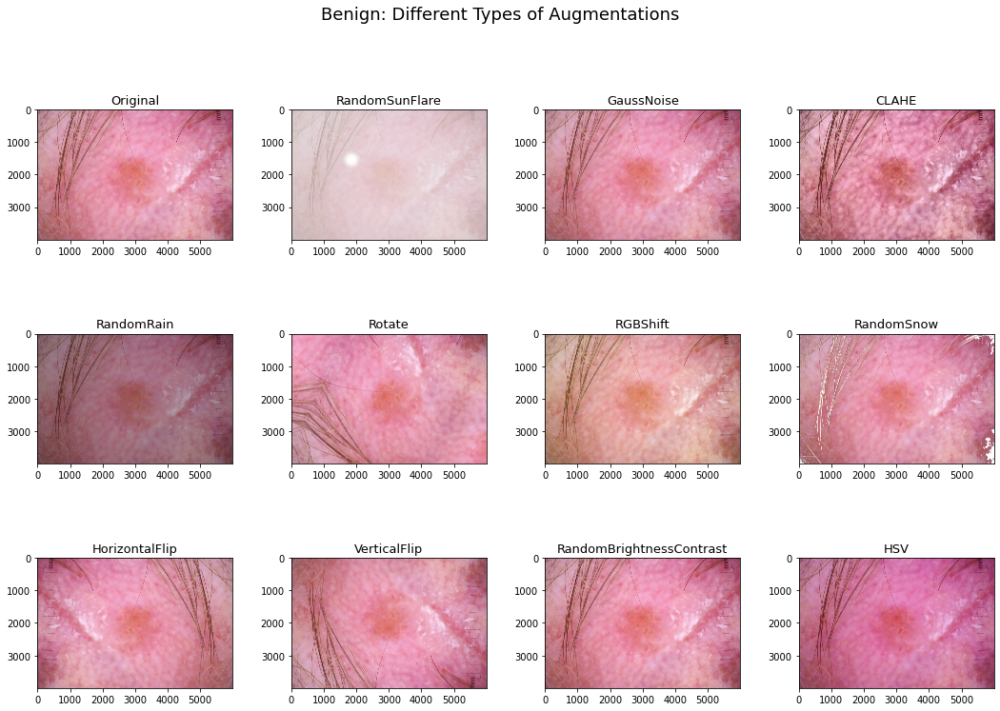

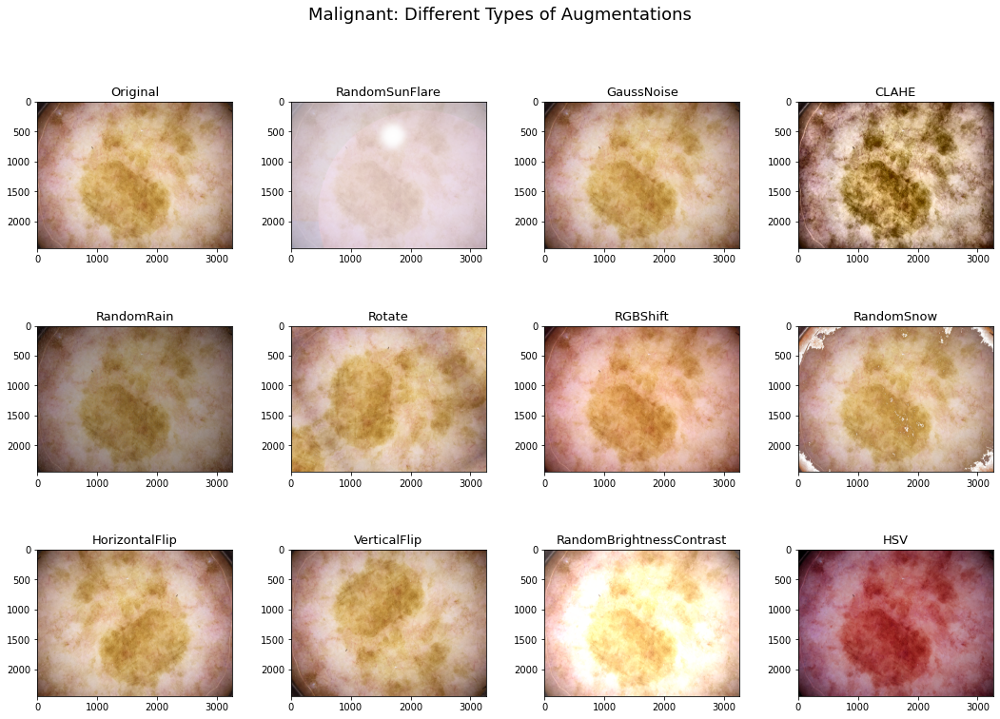

In [26]:
malignant_image = cv2.imread("../input/siim-isic-melanoma-classification/jpeg/train/ISIC_0188432.jpg")[...,::-1]
benign_image = cv2.imread("../input/siim-isic-melanoma-classification/jpeg/train/ISIC_2637011.jpg")[...,::-1]

albumentation_list = [A.RandomSunFlare(p=0.8), A.GaussNoise(p=0.8), A.CLAHE(p=0.9),
                      A.RandomRain(p=1), A.Rotate(p=1, limit=90),
                      A.RGBShift(p=1), A.RandomSnow(p=1),
                      A.HorizontalFlip(p=1), A.VerticalFlip(p=0.8), A.RandomBrightnessContrast(p = 1),
                      A.HueSaturationValue(p=1,hue_shift_limit=20, sat_shift_limit=30, val_shift_limit=50)]

chosen_image = [benign_image, malignant_image]
l = ["Benign: Different Types of Augmentations", "Malignant: Different Types of Augmentations\n"]

for i in range(2):
    img_matrix_list = []
    bboxes_list = []
    for aug_type in albumentation_list:
        img = aug_type(image = chosen_image[i])['image']
        img_matrix_list.append(img)
    img_matrix_list.insert(0, chosen_image[i])    
    titles_list = ["Original","RandomSunFlare","GaussNoise","CLAHE","RandomRain","Rotate", 
                   "RGBShift", "RandomSnow","HorizontalFlip", "VerticalFlip", "RandomBrightnessContrast","HSV"]
    plot_multiple_img(img_matrix_list, titles_list, ncols = 4, main_title = l[i])

### 6. Hue, Saturation, Brigtness 

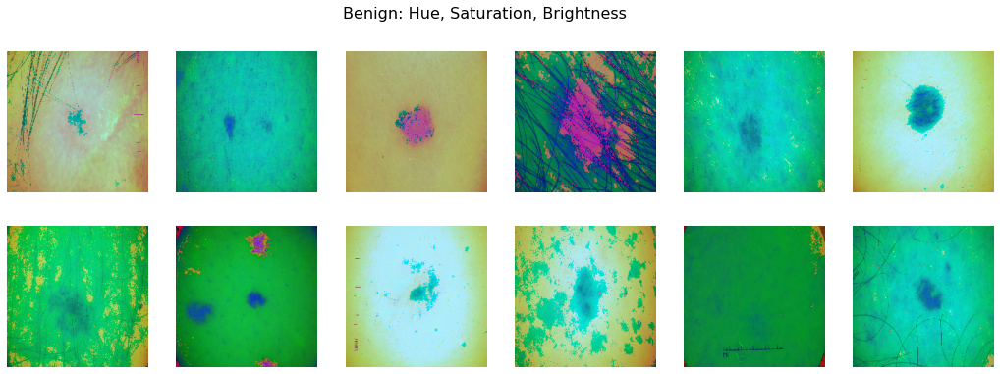

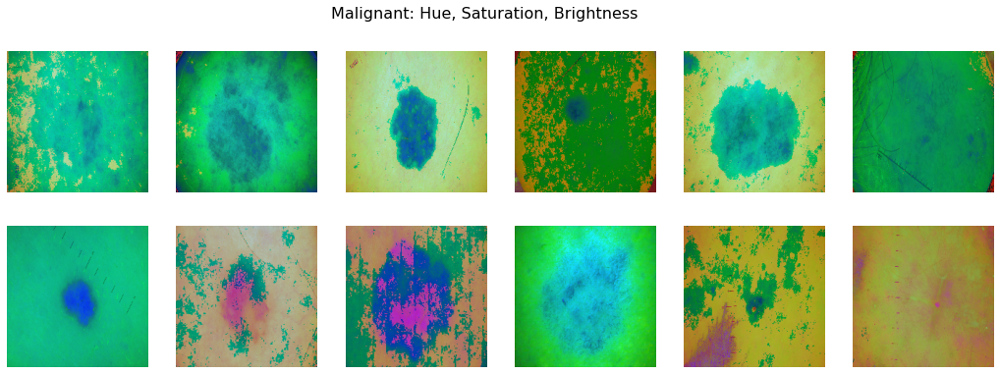

In [27]:
def plot_hue_saturation_brightness(text, df):

    fig, axes = plt.subplots(nrows = 2, ncols = 6, figsize = (18, 6))
    plt.suptitle(text, fontsize = 16)

    for i in range(0, 2*6):
        image = cv2.imread(df['path'][i])[...,::-1]
        image = cv2.cvtColor(image, cv2.COLOR_RGB2HLS)
        image = cv2.resize(image, (200,200))
        x = i // 6
        y = i % 6
        axes[x, y].imshow(image, cmap=plt.cm.bone) 
        axes[x, y].axis('off')
    
plot_hue_saturation_brightness("Benign: Hue, Saturation, Brightness", benign_data)
print()
plot_hue_saturation_brightness("Malignant: Hue, Saturation, Brightness", malignant_data)

### 7. Gaussian Blurr

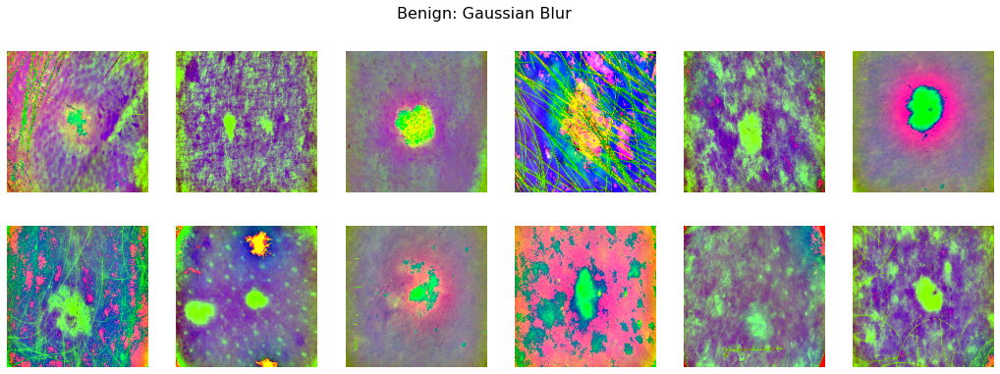

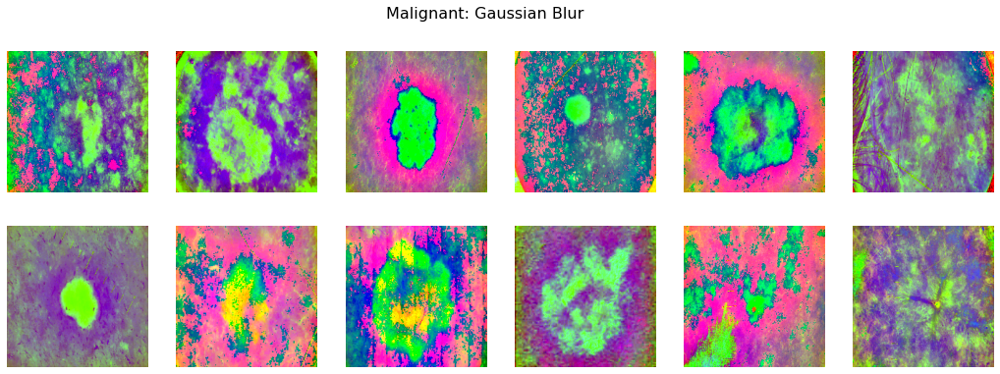

In [28]:
def plot_gaussian_blurr(text, df):

    fig, axes = plt.subplots(nrows = 2, ncols = 6, figsize = (18, 6))
    plt.suptitle(text, fontsize = 16)

    for i in range(0, 12):
        image = cv2.imread(df['path'][i])[...,::-1]
        image = cv2.cvtColor(image, cv2.COLOR_RGB2HSV)
        image = cv2.resize(image, (200,200))
        image=cv2.addWeighted(image, 4, cv2.GaussianBlur(image, (0,0) ,256/10), -4, 128)
        x = i // 6
        y = i % 6
        axes[x, y].imshow(image, cmap=plt.cm.bone) 
        axes[x, y].axis('off')
    

plot_gaussian_blurr("Benign: Gaussian Blur", benign_data)
print()
plot_gaussian_blurr("Malignant: Gaussian Blur", malignant_data)

### 8. Black and White Scale 

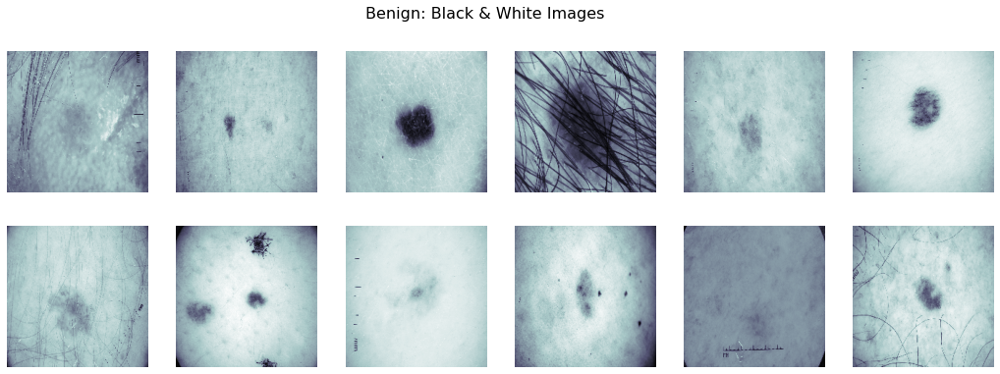

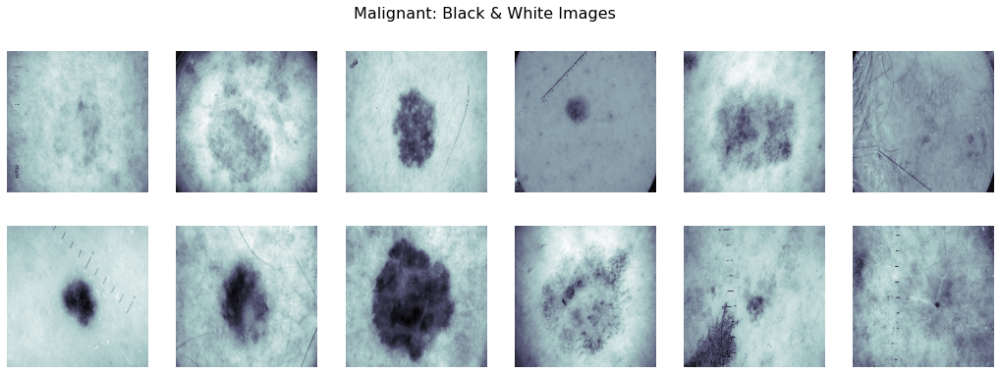

In [29]:
def plot_black_white(text, df):

    fig, axes = plt.subplots(nrows = 2, ncols = 6, figsize = (18, 6))
    plt.suptitle(text, fontsize = 16)

    for i in range(0, 2*6):
        image = cv2.imread(df['path'][i])[...,::-1]
        image = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
        image = cv2.resize(image, (200,200))
        x = i // 6
        y = i % 6
        axes[x, y].imshow(image, cmap=plt.cm.bone) 
        axes[x, y].axis('off')

plot_black_white("Benign: Black & White Images", benign_data)
print()
plot_black_white("Malignant: Black & White Images", malignant_data)

### 9. Ben Grahams Analysis

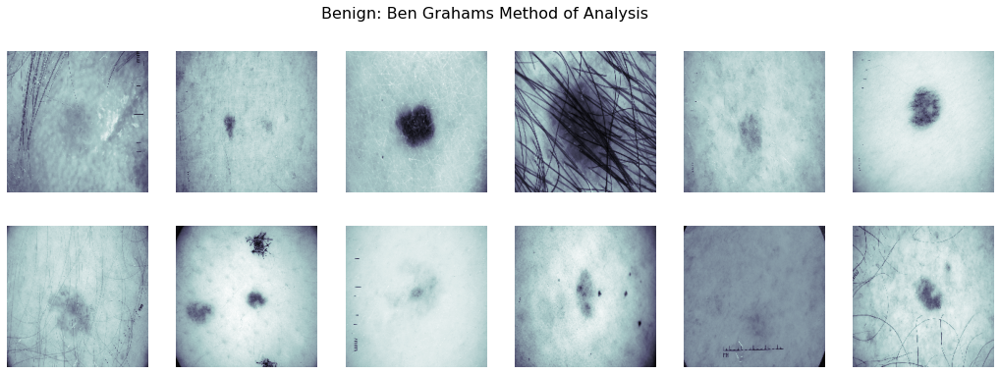

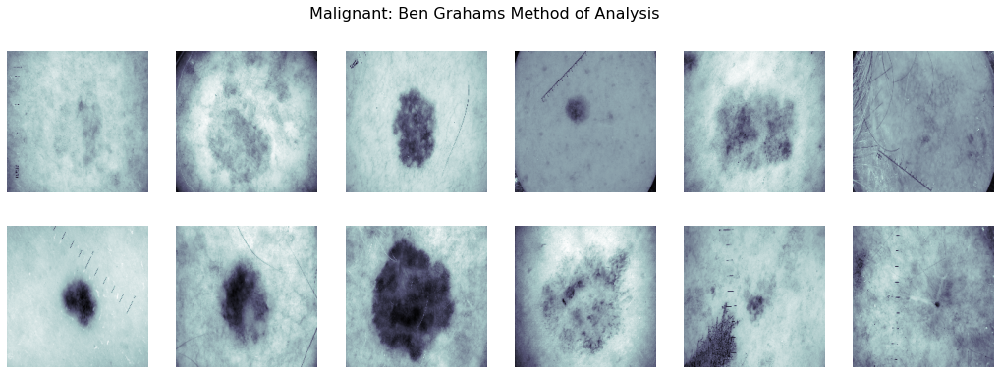

In [30]:
def plot_ben_grahams(text, df):

    fig = plt.figure(figsize = (18, 7))
    fig.suptitle(text, fontsize = 15)
    columns = 4; rows = 2

    for i in range(1, columns*rows +1):
        img = cv2.imread(df['path'][i])[...,::-1]
        img = cv2.resize(img, (512, 512))
        img = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)
        img = cv2.addWeighted (img, 4, cv2.GaussianBlur(img, (0,0), 512/10), -4, 128)
        fig.add_subplot(rows, columns, i)
        plt.imshow(img)
        plt.axis(False)
        
plot_black_white("Benign: Ben Grahams Method of Analysis", benign_data)
print()
plot_black_white("Malignant: Ben Grahams Method of Analysis", malignant_data)

### 10. Skin Cancer at Different Ages

In [31]:
def grid_display(list_of_images, no_of_columns, figsize, title):
    fig = plt.figure(figsize=figsize)
    column = 0
    z = 0
    for i in range(len(list_of_images)):
        column += 1
        
        if column == no_of_columns + 1:
            fig = plt.figure(figsize=figsize)
            column = 1
        fig.add_subplot(1, no_of_columns, column)
        
        if title:
            if i >= no_of_columns:
                plt.title(titles[z])
                z += 1
            else:
                plt.title(titles[i])
                
        list_of_images[i] = cv2.resize(list_of_images[i], (300, 200))
        plt.imshow(list_of_images[i])
        plt.axis('off')

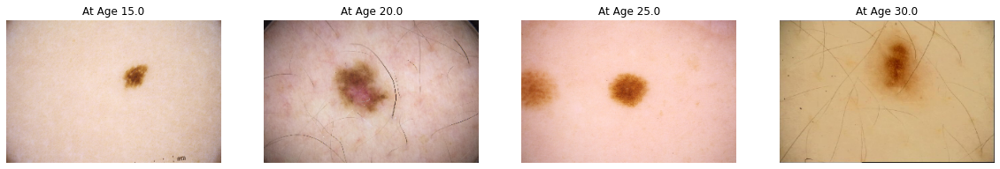

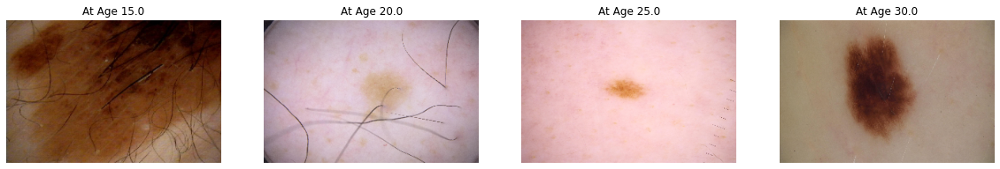

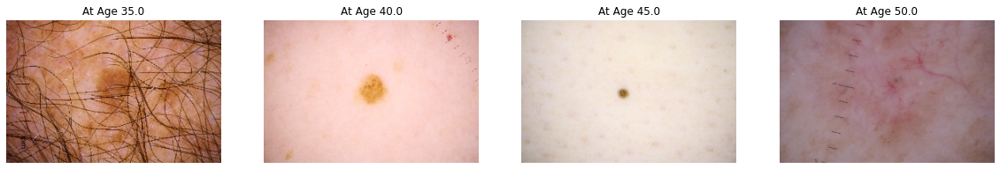

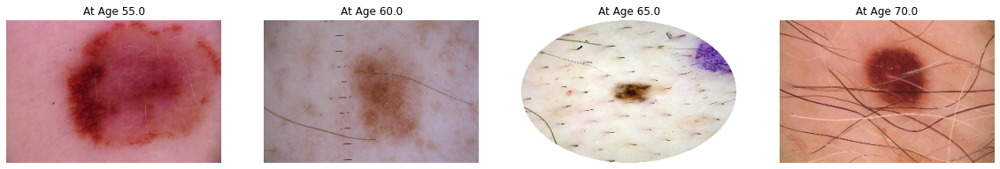

In [32]:
arr = [15.0,20.0,25.0,30.0,35.0,40.0,45.0,50.0,55.0,60.0,65.0,70.0,75.0,80.0,85.0,90.0]
image_all=[]
titles = ['At Age 15.0','At Age 20.0','At Age 25.0','At Age 30.0','At Age 35.0','At Age 40.0'
          ,'At Age 45.0','At Age 50.0','At Age 55.0','At Age 60.0','At Age 65.0','At Age 70.0'
          ,'At Age 75.0','At Age 80.0','At Age 85.0','At Age 90.0']

for i in arr:
    image_list = train_df[train_df['age'] == i].sample()['dcm_name']
    for image_id in image_list:
        image_file = f'/kaggle/input/siim-isic-melanoma-classification/jpeg/train/'+image_id
        img = np.array(Image.open(image_file))
        image_all.append(img)
        
grid_display(image_all, 4, (20, 15), title = True)

### 11. Cropping

In [33]:
def plot_cropping(df, flag):
    if flag == 1:
        img = cv2.imread(df['path'][2])[...,::-1]
    else:
        img = cv2.imread(df['path'][1])[...,::-1]
    
    image_all = []
    titles = ['original', 'Detect Affected Part', "Cropped Image"]
    
    image_all.append(img)

    orb = cv2.ORB_create() # Initiate Detecting Affected Part
    kp = orb.detect(img, None) # find the keypoints with Detecting
    kp, des = orb.compute(img, kp) # compute the descriptors with Detecting

    img2 = cv2.drawKeypoints(img, kp, None, color = (0,255,0), flags = 0) # draw only keypoints location, not size and orientation
    image_all.append(img2)
    img3 = img2[350:800,600:1250]
    image_all.append(img3)

    grid_display(image_all, 3, (20, 15), title = False)

Benign: Cropping Analysis


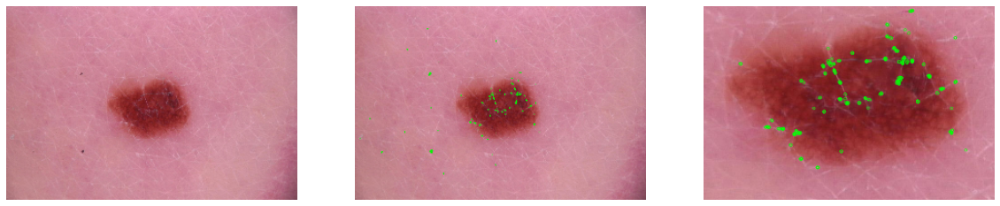

In [34]:
print("Benign: Cropping Analysis")
plot_cropping(benign_data, 1)

Malignant: Cropping Analysis


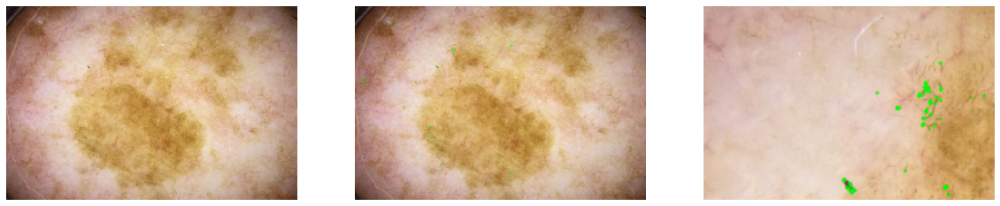

In [35]:
print("Malignant: Cropping Analysis")
plot_cropping(malignant_data, 0)

### 12. Display Different Anatomy that affects on Malanoma

In [36]:
def display_image(df):
    
    random_sampling = [random.randint(0, len(df)) for i in range(9)]
    image_indexes = [list(df.index)[random_sampling[i]] for i in range(len(random_sampling))]
    i = 0
    plt.figure(figsize = (18, 12))
    
    for index in image_indexes:
        image_name = df.loc[index, 'dcm_name'] 
        site = df.loc[index, "anatomy"]
        target = df.loc[index, "target"]        
        plt.subplot(330 + 1 + i) 
        plt.title('Target: {}\n Site: {}\n'.format(target, site), fontsize = 13)
        numpy_image = cv2.imread(train_path +"/"+ image_name)
        numpy_image = cv2.resize(numpy_image, (300, 200))
        plt.imshow(cv2.cvtColor(numpy_image, cv2.COLOR_BGR2RGB))
        plt.axis('off')
        i+=1
        
    plt.subplots_adjust(bottom = 0.001)  
    plt.subplots_adjust(top = 0.99)
    plt.show()

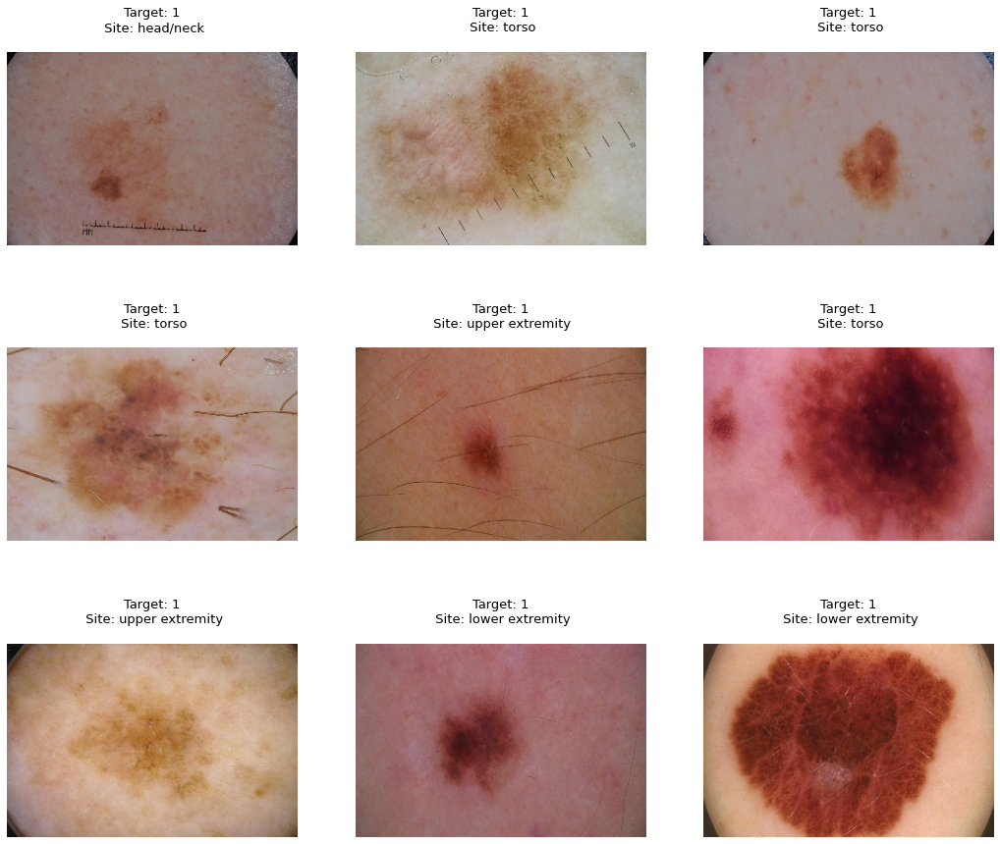

In [37]:
display_image(malignant_data)

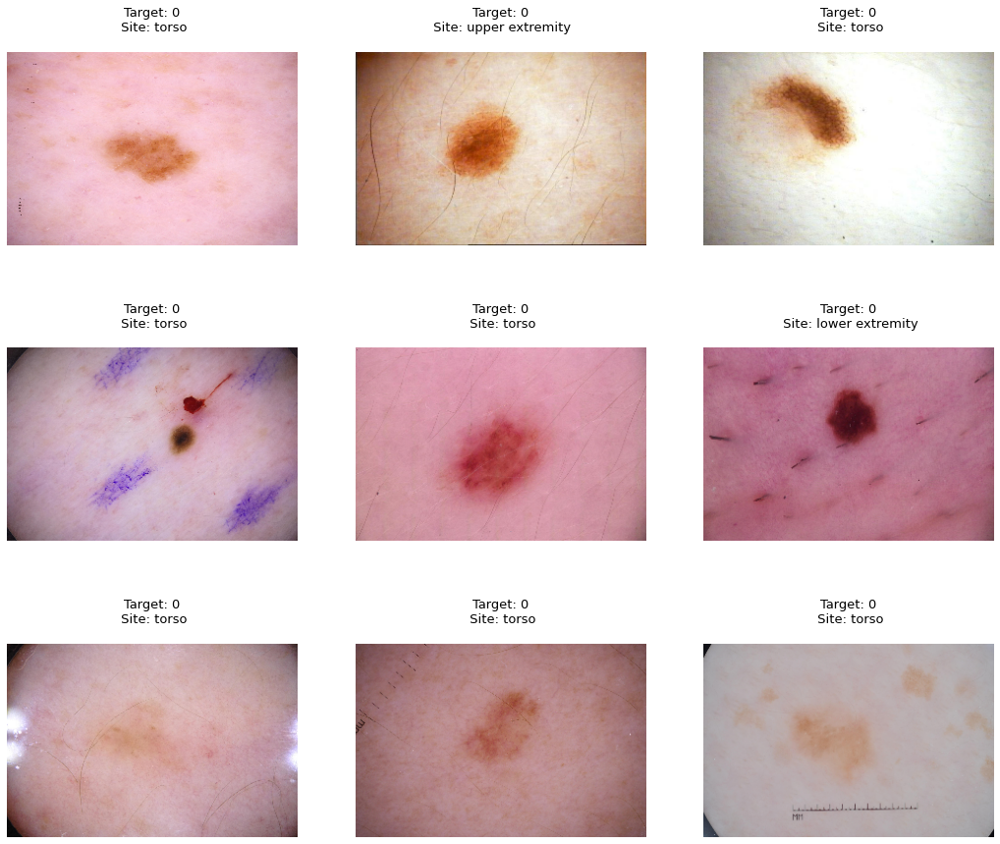

In [38]:
display_image(benign_data)

### 13. Hair Removal

In [39]:
def hair_remove(image):
    
    grayScale = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY) # convert image to grayScale
    kernel = cv2.getStructuringElement(1,(17,17)) # kernel for morphologyEx
    blackhat = cv2.morphologyEx(grayScale, cv2.MORPH_BLACKHAT, kernel) # apply MORPH_BLACKHAT to grayScale image
    _,threshold = cv2.threshold(blackhat,10,255,cv2.THRESH_BINARY) # apply thresholding to blackhat
    final_image = cv2.inpaint(image,threshold,1,cv2.INPAINT_TELEA) # inpaint with original image and threshold image
    
    return final_image

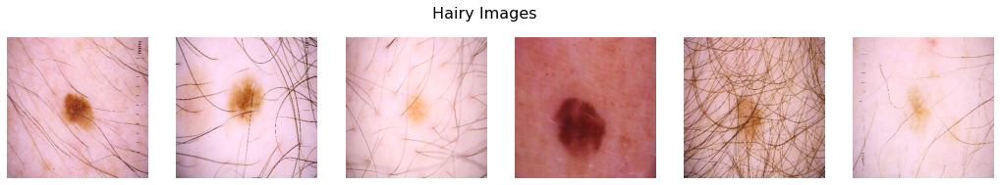

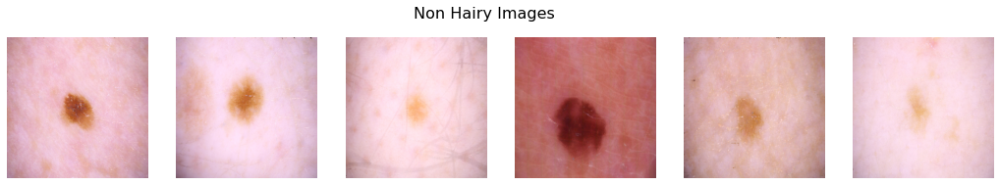

In [40]:
def plot_hair_images(text, flag):

    hairy_photos = train_df[train_df["sex"] == "male"].reset_index().iloc[[12, 14, 17, 22, 33, 34]]
    image_list = hairy_photos['path']
    image_list = image_list.reset_index()['path']
    
    plt.figure(figsize = (18, 3))
    plt.suptitle(text, fontsize = 16)

    for k, path in enumerate(image_list):
        image = cv2.imread(path)[...,::-1]
        image = cv2.resize(image,(300, 300))
        if flag == 1:
            image = hair_remove(image)
            plt.subplot(1, 6, k+1)
            plt.imshow(image)
            plt.axis('off')
        else:
            plt.subplot(1, 6, k+1)
            plt.imshow(image)
            plt.axis('off')

plot_hair_images("Hairy Images", 0)    
plot_hair_images("Non Hairy Images", 1)   

### 14. Color Gitter using PyTorch

In [41]:
image_list = train_df.sample(12)['path']
image_list = image_list.reset_index()['path']

In [42]:
class DatasetExample(Dataset):
    def __init__(self, image_list, transforms=None):
        self.image_list = image_list
        self.transforms = transforms
    
    def __len__(self):
        return (len(self.image_list))
    
    def __getitem__(self, i):
        image = plt.imread(self.image_list[i])
        image = Image.fromarray(image).convert('RGB')        
        image = np.asarray(image).astype(np.uint8)
        if self.transforms is not None:
            image = self.transforms(image)
            
        return torch.tensor(image, dtype=torch.float)

In [43]:
def show_transform(image, title="Default"):
    plt.figure(figsize = (18, 12))
    plt.suptitle(title, fontsize = 16)

    image = image / 2 + 0.5  
    npimg = image.numpy()
    npimg = np.clip(npimg, 0., 1.)
    
    plt.imshow(np.transpose(npimg, (1, 2, 0)))
    plt.axis('off')
    plt.show()

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning:

To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).



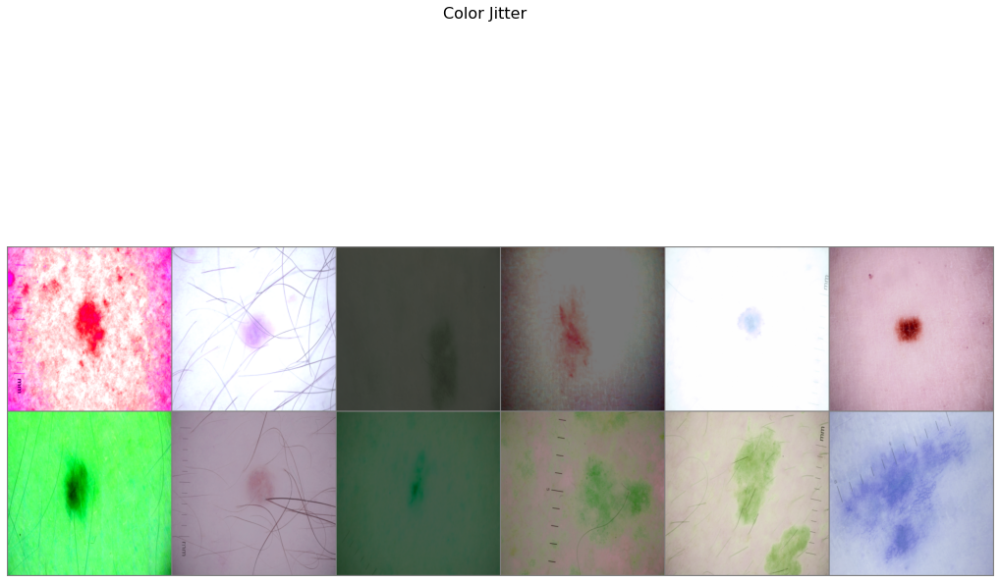

In [44]:
transform = transforms.Compose([
     transforms.ToPILImage(),
     transforms.Resize((300, 300)),
     transforms.ColorJitter(brightness=0.7, contrast=0.7, saturation=0.7, hue=0.5),
     transforms.ToTensor(),
     transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5)),
     ])

pytorch_dataset = DatasetExample(image_list=image_list, transforms=transform)
pytorch_dataloader = DataLoader(dataset=pytorch_dataset, batch_size=12, shuffle=True)
images = next(iter(pytorch_dataloader))
 
show_transform(torchvision.utils.make_grid(images, nrow=6), title="Color Jitter")

# References

> 1. https://www.kaggle.com/code/andradaolteanu/siim-melanoma-competition-eda-augmentations
> 2. https://www.kaggle.com/code/nxrprime/siim-d3-eda-augmentations-and-resnext#three
> 3. https://www.kaggle.com/code/parulpandey/melanoma-classification-eda-starter
> 4. https://www.kaggle.com/code/saife245/melanoma-detail-analysis-eda-ip-augmentation-model
> 5. https://www.kaggle.com/code/sana306/detection-of-covid-positive-cases-using-dl    
> 6. https://www.kaggle.com/code/bryanb/siim-isic-quick-eda